**About the Data**

This data was compiled as the basis for a new account of the Roman urbanism in the imperial period. The data consists of a catalogue of sites with urban characteristics in the Roman Empire between 100 B.C. and A.D. 300, which includes information about their locations and date-ranges, as well as offering  estimates of the sizes of their inhabited areas and bringing together existing evidence for their monuments and civic status. This material was originally assembled for a D.Phil. at the University of Oxford, which has now been published as a monograph (Hanson, J. W. An Urban Geography of the Roman World, 100 B.C. to A.D. 300., 2016, Oxford: Archaeopress)

**Notebook Objectives**

This project aims to provide valuable insights that can help us better understand the characteristics of urbanism in the Roman World. It can be achieved by performing exploratory data analysis, with focus on cleaning and preparing data for visualization. 

Import libraries

In [1]:
# Import packages for data manipulation
import pandas as pd
import numpy as np

# Import packages for data visualization
import folium
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

Load the first excel sheet into a dataframe. Read in the data and store it as a dataframe object.

In [2]:
# Import the first excel sheet
cities = pd.read_excel('roman_cities.xlsx', sheet_name = 'Cities')

# Print the first 10 entries to confirm loading
cities.head(10)

,Primary Key,Ancient Toponym,Modern Toponym,Province,Country,Barrington Atlas Rank,Barrington Atlas Reference,Start Date,End Date,Longitude (X),Latitude (Y),Select Bibliography
0,Hanson2016_1,Abae,Kalapodi,Achaea,Greece,4 or 5,55 D3,-600,NaN,22.933333,38.583333,BNP; Hansen 2006; Hansen and Nielsen 2004; PEC...
1,Hanson2016_2,Acharnae,Acharnes,Achaea,Greece,3,59 B2,-600,NaN,23.734088,38.083473,BNP; DGRG; PECS; Sear 2006.
2,Hanson2016_3,Acraephia,Akraifnio,Achaea,Greece,3,55 E4,-600,NaN,23.219702,38.452606,BNP; DGRG; Hansen and Nielsen 2004; PECS; Sear...
3,Hanson2016_4,Aegina,Aigina,Achaea,Greece,2,59 A3,-600,NaN,23.428500,37.750074,BNP; DGRG; Hansen 2006; Hansen and Nielsen 200...
4,Hanson2016_5,Aegira,Aigeira,Achaea,Greece,3,58 C1,-600,NaN,22.355720,38.147951,DGRG; Hansen and Nielsen 2004.
5,Hanson2016_6,Aegium,Aigio,Achaea,Greece,3,58 C1,-600,NaN,22.081952,38.252707,BNP; DGRG; Hansen and Nielsen 2004; PECS; Sear...
6,Hanson2016_7,Ambracia,Arta,Achaea,Greece,3,54 C3,-635,-30.0,20.987000,39.158000,BNP; DGRG; Hansen 2006; Hansen and Nielsen 200...
7,Hanson2016_8,Amphissa,Amfissa,Achaea,Greece,3,55 C3,-400,NaN,22.378406,38.527328,BNP; Hansen and Nielsen 2004; PECS.
8,Hanson2016_9,Anthedon,Anthedon,Achaea,Greece,3,55 E4,-400,NaN,23.461481,38.497543,BNP; DGRG; Hansen 2006; Hansen and Nielsen 200...
9,Hanson2016_10,Anticyra,Palatia,Achaea,Greece,3,55 D4,-400,NaN,22.632895,38.377588,BNP; DGRG; Hansen and Nielsen 2004; PECS.


Print dataframe info

In [3]:
# Print first sheet Info
print('.: Data Info :.')
print('*'*30)
print('>> Total Rows:', cities.shape[0])
print('>> Total Columns:', cities.shape[1])
print('*' * 30)

# Print first sheet Detail 
print('.: Data Details :.')
print('*'*30)
cities.info()

.: Data Info :.
******************************
>> Total Rows: 1388
>> Total Columns: 12
******************************
.: Data Details :.
******************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1388 entries, 0 to 1387
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Primary Key                 1388 non-null   object 
 1   Ancient Toponym             1388 non-null   object 
 2   Modern Toponym              1388 non-null   object 
 3   Province                    1388 non-null   object 
 4   Country                     1388 non-null   object 
 5   Barrington Atlas Rank       1388 non-null   object 
 6   Barrington Atlas Reference  1388 non-null   object 
 7   Start Date                  1388 non-null   int64  
 8   End Date                    38 non-null     float64
 9   Longitude (X)               1388 non-null   float64
 10  Latitude (Y)                1388 no

Check for missing values and duplicates

In [4]:
# Check for duplicates
cities.drop_duplicates().shape

(1388, 12)

In [5]:
# Check for missing values
cities.isna().sum()

Primary Key                      0
Ancient Toponym                  0
Modern Toponym                   0
Province                         0
Country                          0
Barrington Atlas Rank            0
Barrington Atlas Reference       0
Start Date                       0
End Date                      1350
Longitude (X)                    0
Latitude (Y)                     0
Select Bibliography              3
dtype: int64

Drop unnessesary columns. Drop "End date" column too, as it has too many missing values

In [6]:
# Drop columns
cities.drop(['Barrington Atlas Rank','Barrington Atlas Reference','End Date','Select Bibliography'], axis=1, inplace=True)

# Check results
cities.head(2)

,Primary Key,Ancient Toponym,Modern Toponym,Province,Country,Start Date,Longitude (X),Latitude (Y)
0,Hanson2016_1,Abae,Kalapodi,Achaea,Greece,-600,22.933333,38.583333
1,Hanson2016_2,Acharnae,Acharnes,Achaea,Greece,-600,23.734088,38.083473


Rename columns with ambiguous names

In [7]:
# Rename columns
cities = cities.rename(columns={'Ancient Toponym':'Ancient Name', 'Modern Toponym':'Modern Name', 'Province':'Roman Province', 'Country':'Modern Country', 'Start Date':'Year of Foundation', 'Longitude (X)':'Longitude', 'Latitude (Y)':'Latitude'})

# Check results
cities.columns

Index(['Primary Key', 'Ancient Name', 'Modern Name', 'Roman Province',
       'Modern Country', 'Year of Foundation', 'Longitude', 'Latitude'],
      dtype='object')

Let's see how ancient cities are distributed across the territories of modern countries

In [8]:
# Check value counts
cities['Modern Country'].value_counts()

Modern Country
Italy                     372
Turkey                    184
Greece                    135
Spain                     116
France                    106
Tunisia                    74
Algeria                    49
Egypt                      47
Croatia                    44
United Kingdom             28
Israel                     23
Bulgaria                   18
Syria                      17
Romania                    17
Portugal                   15
Bosnia and Herzegovina     14
Germany                    13
Libya                      12
Austria                    12
Albania                    12
Serbia                     10
Jordan                      8
Switzerland                 8
Hungary                     8
Morocco                     7
Lebanon                     7
Cyprus                      7
Montenegro                  6
Northern Cyprus             5
Macedonia                   4
Slovenia                    4
Netherlands                 2
Kosovo                   

In some countries the number of ancient cities is very small. To simplify visualization, we will add a column where countries with the count of cities  less than 25 are written as 'Other Countries'.

In [9]:
# Create a threshold of 30 for value_counts
counts = cities['Modern Country'].value_counts()
idx = counts[counts.lt(30)].index

# Add a new column with the names of the countries but rename any record below the threshold to 'Other Countries'
cities.loc[cities['Modern Country'].isin(idx), 'Country Updated'] = 'Other Countries'
cities.loc[~cities['Modern Country'].isin(idx), 'Country Updated'] = cities['Modern Country']

# Check results
cities['Country Updated'].value_counts()

Country Updated
Italy              372
Other Countries    261
Turkey             184
Greece             135
Spain              116
France             106
Tunisia             74
Algeria             49
Egypt               47
Croatia             44
Name: count, dtype: int64

Convert count of cities per country to DataFrame and create a pie chart using Matplotlib

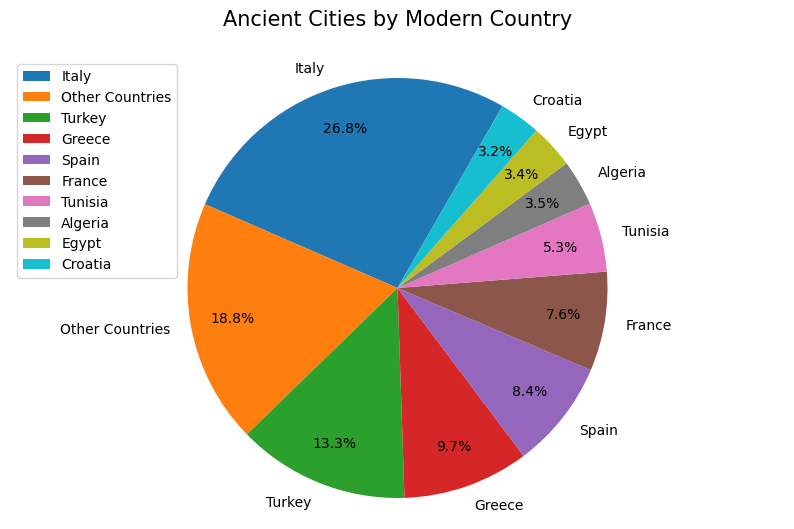

In [10]:
cities_per_country = cities['Country Updated'].value_counts().to_frame('Counts')

cities_per_country['Counts'].plot(kind='pie',
                            figsize=(10, 6),
                            autopct='%1.1f%%', 
                            startangle=60,
                            pctdistance=0.8,
                            label = ''
                            )

plt.title('Ancient Cities by Modern Country', y=1.05, fontsize = 15) 
plt.axis('equal')

plt.legend(labels=cities_per_country.index, loc='upper left', fontsize=10) 

plt.show()

Now let's superimpose the locations of the ancient cities onto the map using folium.

In [11]:
# Mediterranean latitude and longitude values
latitude = 41
longitude = 16

In [12]:
# create map and display it
cities_map = folium.Map(location=[latitude, longitude], zoom_start=5)

# loop through the cities and add each to the map with the corresponding modern name and the date of foundation
for lat, lng, ancient, modern, date in zip(cities['Latitude'], cities['Longitude'], cities['Ancient Name'], cities['Modern Name'], cities['Year of Foundation']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5, 
        color='green',
        fill=True,
        popup='Ancient:{} Modern:{} Founding:{}'.format(ancient, modern, date),
        fill_color='yellow',
        fill_opacity=0.6
    ).add_to(cities_map)

# show map
cities_map

The map can be too congested will all these markers. As a simple solution we can group the markers into different clusters. Each cluster is then represented by the number of cities in the area.

In [13]:
# import plugins
from folium import plugins

# Create a clean copy of the map
cities_map2 = folium.Map(location = [latitude, longitude], zoom_start = 5)

# instantiate a mark cluster object for the cities in the dataframe
cities_cluster = plugins.MarkerCluster().add_to(cities_map2)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, ancient, modern, date in zip(cities['Latitude'], cities['Longitude'], cities['Ancient Name'], cities['Modern Name'], cities['Year of Foundation']):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup='Ancient:{} Modern:{} Founding:{}'.format(ancient, modern, date),
    ).add_to(cities_cluster)

# display map
cities_map2

Let's see how the founding years of cities are distributed using line plot

<Axes: xlabel='Year of Foundation'>

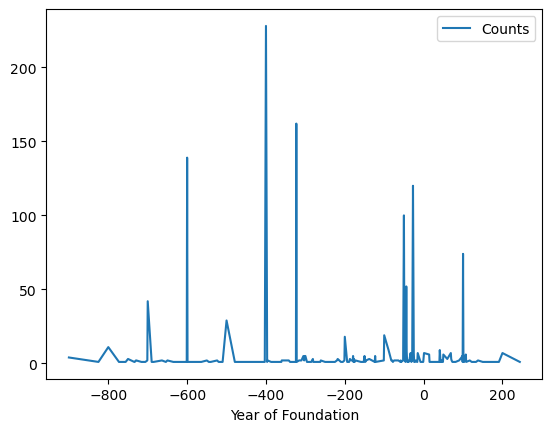

In [14]:
cities_by_year = cities['Year of Foundation'].value_counts().to_frame('Counts').sort_index()
cities_by_year.plot(kind = 'line')

That doesn't look right. Many cities in the dataset do not have an exact founding date and are designated by the century, which leads to peaks in the graph.
We can try to solve this problem by creating a new column that converts years to centuries.

In [15]:
# Define a function that will convert years to centuries
def centuryFromYear(year):
    if year > 0:
        return (year) // 100 + 1    # 1 because 2017 is 21st century, and 1989 = 20th century
    else: return (year) // 100

In [16]:
# Apply the function to the year column and put the result in the new column
cities['Century'] = cities['Year of Foundation'].apply(lambda x: centuryFromYear(x))

# Check results
cities.head(10)

,Primary Key,Ancient Name,Modern Name,Roman Province,Modern Country,Year of Foundation,Longitude,Latitude,Country Updated,Century
0,Hanson2016_1,Abae,Kalapodi,Achaea,Greece,-600,22.933333,38.583333,Greece,-6
1,Hanson2016_2,Acharnae,Acharnes,Achaea,Greece,-600,23.734088,38.083473,Greece,-6
2,Hanson2016_3,Acraephia,Akraifnio,Achaea,Greece,-600,23.219702,38.452606,Greece,-6
3,Hanson2016_4,Aegina,Aigina,Achaea,Greece,-600,23.428500,37.750074,Greece,-6
4,Hanson2016_5,Aegira,Aigeira,Achaea,Greece,-600,22.355720,38.147951,Greece,-6
5,Hanson2016_6,Aegium,Aigio,Achaea,Greece,-600,22.081952,38.252707,Greece,-6
6,Hanson2016_7,Ambracia,Arta,Achaea,Greece,-635,20.987000,39.158000,Greece,-7
7,Hanson2016_8,Amphissa,Amfissa,Achaea,Greece,-400,22.378406,38.527328,Greece,-4
8,Hanson2016_9,Anthedon,Anthedon,Achaea,Greece,-400,23.461481,38.497543,Greece,-4
9,Hanson2016_10,Anticyra,Palatia,Achaea,Greece,-400,22.632895,38.377588,Greece,-4


Let's plot the data by centuries instead of years

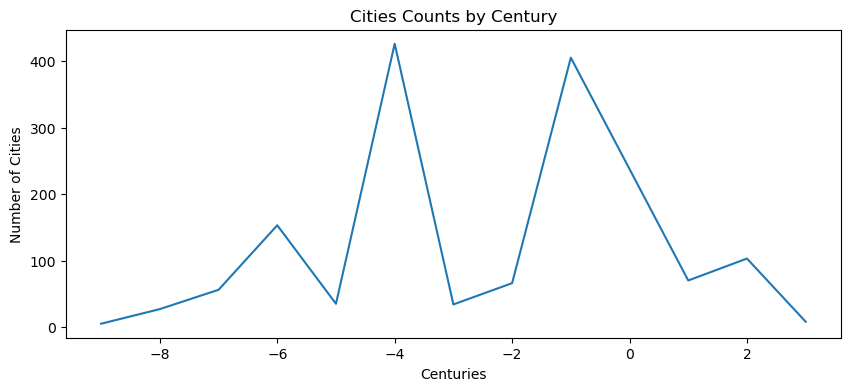

In [17]:
cities_by_century = cities['Century'].value_counts().to_frame('Counts').sort_index()

plt.figure(figsize=(10,4)) 
plt.plot(cities_by_century)

plt.title('Cities Counts by Century')
plt.ylabel('Number of Cities')
plt.xlabel('Centuries')

plt.show()

Let's load another excel sheet with civic status data

In [18]:
# Import the second excel sheet
civic_status = pd.read_excel('roman_cities.xlsx', sheet_name = 'Civic Status')

# Print the first 10 entries to confirm loading
civic_status.head(10)

,Primary Key,Civic Status
0,Hanson2016_1,Rights and privileges
1,Hanson2016_4,Rights and privileges
2,Hanson2016_8,Rights and privileges
3,Hanson2016_14,Rights and privileges
4,Hanson2016_16,Colonia
5,Hanson2016_25,Rights and privileges
6,Hanson2016_26,Provincial capital
7,Hanson2016_28,Rights and privileges
8,Hanson2016_29,Rights and privileges
9,Hanson2016_32,Colonia


Print the information about the data in the second sheet. 

In [19]:
# Print second sheet Info
print('.: Data Info :.')
print('*'*30)
print('>> Total Rows:', civic_status.shape[0])
print('>> Total Columns:', civic_status.shape[1])
print('*' * 30)

# Print second sheet Detail 
print('.: Data Details :.')
print('*'*30)
civic_status.info()

.: Data Info :.
******************************
>> Total Rows: 1080
>> Total Columns: 2
******************************
.: Data Details :.
******************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Primary Key   1080 non-null   object
 1   Civic Status  1080 non-null   object
dtypes: object(2)
memory usage: 17.0+ KB


Check for duplicates and missing values

In [20]:
# Check for duplicates
civic_status.drop_duplicates().shape

(1080, 2)

In [21]:
# Check for missing values
civic_status.isna().sum()

Primary Key     0
Civic Status    0
dtype: int64

Check how many cities of each civic status are there.

In [22]:
civic_status['Civic Status'].value_counts()

Civic Status
Municipium                       536
Colonia                          234
Metropolis capital                95
Rights and privileges             74
Provincial capital                67
Civitas capital                   58
Conventus capital                 10
City of the Syrian Decapolis       3
City of the Libyan Pentapolis      2
Capital of the Empire              1
Name: count, dtype: int64

Let's merge civic_status dataframe with cities dataframe.

In [23]:
# merge two datasets
cities = cities.merge(civic_status, how='left', on=['Primary Key'])
cities.head(10)

,Primary Key,Ancient Name,Modern Name,Roman Province,Modern Country,Year of Foundation,Longitude,Latitude,Country Updated,Century,Civic Status
0,Hanson2016_1,Abae,Kalapodi,Achaea,Greece,-600,22.933333,38.583333,Greece,-6,Rights and privileges
1,Hanson2016_2,Acharnae,Acharnes,Achaea,Greece,-600,23.734088,38.083473,Greece,-6,NaN
2,Hanson2016_3,Acraephia,Akraifnio,Achaea,Greece,-600,23.219702,38.452606,Greece,-6,NaN
3,Hanson2016_4,Aegina,Aigina,Achaea,Greece,-600,23.428500,37.750074,Greece,-6,Rights and privileges
4,Hanson2016_5,Aegira,Aigeira,Achaea,Greece,-600,22.355720,38.147951,Greece,-6,NaN
5,Hanson2016_6,Aegium,Aigio,Achaea,Greece,-600,22.081952,38.252707,Greece,-6,NaN
6,Hanson2016_7,Ambracia,Arta,Achaea,Greece,-635,20.987000,39.158000,Greece,-7,NaN
7,Hanson2016_8,Amphissa,Amfissa,Achaea,Greece,-400,22.378406,38.527328,Greece,-4,Rights and privileges
8,Hanson2016_9,Anthedon,Anthedon,Achaea,Greece,-400,23.461481,38.497543,Greece,-4,NaN
9,Hanson2016_10,Anticyra,Palatia,Achaea,Greece,-400,22.632895,38.377588,Greece,-4,NaN


Check if there are missing values

In [24]:
cities.isna().sum()

Primary Key             0
Ancient Name            0
Modern Name             0
Roman Province          0
Modern Country          0
Year of Foundation      0
Longitude               0
Latitude                0
Country Updated         0
Century                 0
Civic Status          308
dtype: int64

Let's see which cities in which provinces lack status data

In [25]:
# create a new DataFrame for cities with missing status data
null_cities = cities[cities['Civic Status'].isnull()]

# check top 10 provinces by count of cities with missing data
null_cities['Roman Province'].value_counts().iloc[:10]

Roman Province
Achaea                    82
Asia                      39
Lycia et Pamphylia        34
Cilicia et Cyprus         21
Creta et Cyrenaica        10
Syria                     10
Hispania Tarraconensis     9
Gallia Lugdunensis         9
Africa Proconsularis       8
Germania Superior          8
Name: count, dtype: int64

In [39]:
null_cities['Roman Province'].value_counts().iloc[:10]

Roman Province
Achaea                    82
Asia                      39
Lycia et Pamphylia        34
Cilicia et Cyprus         21
Creta et Cyrenaica        10
Syria                     10
Hispania Tarraconensis     9
Gallia Lugdunensis         9
Africa Proconsularis       8
Germania Superior          8
Name: count, dtype: int64

As we can see, most of the missing data is associated with Greek cities in the eastern provinces. Greek cities enjoyed privileges and rights of self-government within the structure of the empire. Let's fill those missing values with "Rights and privileges".

In [26]:
# replace the NULL values with a specified value
cities['Civic Status'] = cities['Civic Status'].fillna('Rights and privileges')

Let's update the map with custom colors for each civic status

In [30]:
# Create map and display it
cities_map = folium.Map(location=[latitude, longitude], zoom_start=5)

# define a function that assigns a color to each status type
def color(status): 
    if status == 'Municipium': 
        col = 'darkblue'
    elif status == 'Colonia': 
        col = 'red'
    elif status == 'Metropolis capital': 
        col = 'orange'
    elif status == 'Rights and privileges': 
        col='green'
    elif status == 'Civitas capital': 
        col='yellow'
    else:
        col='gray'
    return col 
    

# loop through the 100 crimes and add each to the map
for lat, lng, ancient, modern, date, status in zip(cities['Latitude'], cities['Longitude'], cities['Ancient Name'], cities['Modern Name'], cities['Year of Foundation'], cities['Civic Status']):
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color=None,
        fill=True,
        popup='Ancient:{} Modern:{} Founding:{} Status:{}'.format(ancient, modern, date, status),
        fill_color= color(status),
        fill_opacity=1
    ).add_to(cities_map)

# show map
cities_map

Let's load another excel sheet which has information about areas

In [32]:
areas = pd.read_excel('roman_cities.xlsx', sheet_name = 'Areas')

areas.head(10)

,Primary Key,Area,Estimate Basis
0,Hanson2016_1,16,Walls
1,Hanson2016_4,52,Inhabited area
2,Hanson2016_7,130,Walls
3,Hanson2016_9,30,Walls
4,Hanson2016_11,45,Inhabited area
5,Hanson2016_13,199,Walls
6,Hanson2016_14,225,Walls of Themistocles and Valerian
7,Hanson2016_15,64,Walls
8,Hanson2016_16,13,Walls
9,Hanson2016_17,25,Walls


Check the data for duplicates and missing values

In [33]:
areas.shape

(885, 3)

In [34]:
areas.drop_duplicates().shape

(885, 3)

In [35]:
areas.isna().sum()

Primary Key       0
Area              0
Estimate Basis    0
dtype: int64

Drop the 'Estimate Basis' column

In [36]:
areas.drop(['Estimate Basis'], axis=1, inplace=True)
areas.head(2)

,Primary Key,Area
0,Hanson2016_1,16
1,Hanson2016_4,52


Join areas with cities dataframe

In [37]:
cities = cities.merge(areas, how='left', on=['Primary Key'])
cities.head(10)

,Primary Key,Ancient Name,Modern Name,Roman Province,Modern Country,Year of Foundation,Longitude,Latitude,Country Updated,Century,Civic Status,Area
0,Hanson2016_1,Abae,Kalapodi,Achaea,Greece,-600,22.933333,38.583333,Greece,-6,Rights and privileges,16.0
1,Hanson2016_2,Acharnae,Acharnes,Achaea,Greece,-600,23.734088,38.083473,Greece,-6,Rights and privileges,NaN
2,Hanson2016_3,Acraephia,Akraifnio,Achaea,Greece,-600,23.219702,38.452606,Greece,-6,Rights and privileges,NaN
3,Hanson2016_4,Aegina,Aigina,Achaea,Greece,-600,23.428500,37.750074,Greece,-6,Rights and privileges,52.0
4,Hanson2016_5,Aegira,Aigeira,Achaea,Greece,-600,22.355720,38.147951,Greece,-6,Rights and privileges,NaN
5,Hanson2016_6,Aegium,Aigio,Achaea,Greece,-600,22.081952,38.252707,Greece,-6,Rights and privileges,NaN
6,Hanson2016_7,Ambracia,Arta,Achaea,Greece,-635,20.987000,39.158000,Greece,-7,Rights and privileges,130.0
7,Hanson2016_8,Amphissa,Amfissa,Achaea,Greece,-400,22.378406,38.527328,Greece,-4,Rights and privileges,NaN
8,Hanson2016_9,Anthedon,Anthedon,Achaea,Greece,-400,23.461481,38.497543,Greece,-4,Rights and privileges,30.0
9,Hanson2016_10,Anticyra,Palatia,Achaea,Greece,-400,22.632895,38.377588,Greece,-4,Rights and privileges,NaN


Check for missing values

In [38]:
cities.isna().sum()

Primary Key             0
Ancient Name            0
Modern Name             0
Roman Province          0
Modern Country          0
Year of Foundation      0
Longitude               0
Latitude                0
Country Updated         0
Century                 0
Civic Status            0
Area                  503
dtype: int64

Replace the missing values with the average area of cities with similar status

In [40]:
cities['Area'] = cities.groupby('Civic Status')['Area'].transform(lambda x: x.fillna(x.mean()))

# round the area to two decimal places
cities['Area'] = cities['Area'].round(decimals=2)

cities.head(50)

,Primary Key,Ancient Name,Modern Name,Roman Province,Modern Country,Year of Foundation,Longitude,Latitude,Country Updated,Century,Civic Status,Area
0,Hanson2016_1,Abae,Kalapodi,Achaea,Greece,-600,22.933333,38.583333,Greece,-6,Rights and privileges,16.00
1,Hanson2016_2,Acharnae,Acharnes,Achaea,Greece,-600,23.734088,38.083473,Greece,-6,Rights and privileges,50.89
2,Hanson2016_3,Acraephia,Akraifnio,Achaea,Greece,-600,23.219702,38.452606,Greece,-6,Rights and privileges,50.89
3,Hanson2016_4,Aegina,Aigina,Achaea,Greece,-600,23.428500,37.750074,Greece,-6,Rights and privileges,52.00
4,Hanson2016_5,Aegira,Aigeira,Achaea,Greece,-600,22.355720,38.147951,Greece,-6,Rights and privileges,50.89
5,Hanson2016_6,Aegium,Aigio,Achaea,Greece,-600,22.081952,38.252707,Greece,-6,Rights and privileges,50.89
6,Hanson2016_7,Ambracia,Arta,Achaea,Greece,-635,20.987000,39.158000,Greece,-7,Rights and privileges,130.00
7,Hanson2016_8,Amphissa,Amfissa,Achaea,Greece,-400,22.378406,38.527328,Greece,-4,Rights and privileges,50.89
8,Hanson2016_9,Anthedon,Anthedon,Achaea,Greece,-400,23.461481,38.497543,Greece,-4,Rights and privileges,30.00
9,Hanson2016_10,Anticyra,Palatia,Achaea,Greece,-400,22.632895,38.377588,Greece,-4,Rights and privileges,50.89


Show Top 10 largest cities by area

In [42]:
top_cities_areas = cities[['Ancient Name', 'Area']].sort_values(by = ['Area'], ascending = False).iloc[:10]

top_cities_areas.head(10)

,Ancient Name,Area
991,Roma,1783.0
109,Alexandria (Aegyptus),972.0
179,Lepcis Magna,466.0
308,Rhodus,412.0
1323,Antiochia (Syria),399.0
171,Carthago,343.0
92,Sparta,304.0
1319,Syracusae,296.0
115,Arsinoe,288.0
248,Alexandria (Asia),287.0


Create a bar plot using plotly

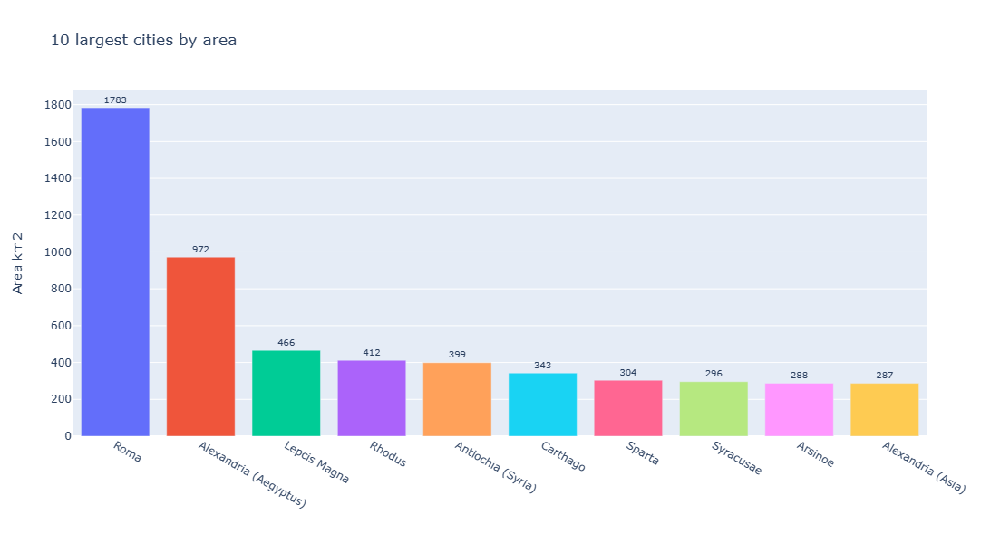

In [43]:
fig = px.bar(top_cities_areas, x= 'Ancient Name', y= 'Area', title='10 largest cities by area', width=700, height=600, color = 'Ancient Name', text_auto=True)

fig.update_layout(
    xaxis_title="",
    yaxis_title="Area km2",
    showlegend=False
)

fig.update_traces(textfont_size=10, textangle=0, textposition="outside", cliponaxis=False)

fig.show()

Let's look at the average and median values of the areas of cities depending on their status

In [40]:
cities.groupby(['Civic Status'])['Area'].mean()

Civic Status
Capital of the Empire            1783.000000
City of the Libyan Pentapolis      22.000000
City of the Syrian Decapolis       67.000000
Civitas capital                    49.775510
Colonia                            46.422535
Conventus capital                  49.800000
Metropolis capital                110.307692
Municipium                         33.236311
Provincial capital                117.083333
Rights and privileges              50.886878
Name: Area, dtype: float64

In [45]:
cities.groupby(['Civic Status'])['Area'].median()

Civic Status
Capital of the Empire            1783.000000
City of the Libyan Pentapolis      22.000000
City of the Syrian Decapolis       67.000000
Civitas capital                    46.500000
Colonia                            46.422535
Conventus capital                  35.500000
Metropolis capital                110.307692
Municipium                         33.236311
Provincial capital                 78.000000
Rights and privileges              50.886878
Name: Area, dtype: float64

Classify cities to four categories depending on their size

In [46]:
# define a function that classifies areas
def bins(area):
    if area >= 230:
        return 'Very Big'
    elif area >= 100:
        return 'Big'
    elif area >= 35:
        return 'Medium'
    else:
        return 'Small'

In [47]:
# apply the finction
cities['Size'] = cities['Area'].apply(bins)
cities.head(10)

,Primary Key,Ancient Name,Modern Name,Roman Province,Modern Country,Year of Foundation,Longitude,Latitude,Country Updated,Century,Civic Status,Area,Size
0,Hanson2016_1,Abae,Kalapodi,Achaea,Greece,-600,22.933333,38.583333,Greece,-6,Rights and privileges,16.00,Small
1,Hanson2016_2,Acharnae,Acharnes,Achaea,Greece,-600,23.734088,38.083473,Greece,-6,Rights and privileges,50.89,Medium
2,Hanson2016_3,Acraephia,Akraifnio,Achaea,Greece,-600,23.219702,38.452606,Greece,-6,Rights and privileges,50.89,Medium
3,Hanson2016_4,Aegina,Aigina,Achaea,Greece,-600,23.428500,37.750074,Greece,-6,Rights and privileges,52.00,Medium
4,Hanson2016_5,Aegira,Aigeira,Achaea,Greece,-600,22.355720,38.147951,Greece,-6,Rights and privileges,50.89,Medium
5,Hanson2016_6,Aegium,Aigio,Achaea,Greece,-600,22.081952,38.252707,Greece,-6,Rights and privileges,50.89,Medium
6,Hanson2016_7,Ambracia,Arta,Achaea,Greece,-635,20.987000,39.158000,Greece,-7,Rights and privileges,130.00,Big
7,Hanson2016_8,Amphissa,Amfissa,Achaea,Greece,-400,22.378406,38.527328,Greece,-4,Rights and privileges,50.89,Medium
8,Hanson2016_9,Anthedon,Anthedon,Achaea,Greece,-400,23.461481,38.497543,Greece,-4,Rights and privileges,30.00,Small
9,Hanson2016_10,Anticyra,Palatia,Achaea,Greece,-400,22.632895,38.377588,Greece,-4,Rights and privileges,50.89,Medium


In [49]:
areas_count = cities['Size'].value_counts().to_frame('Counts')
areas_count['Size'] = areas_count.index
areas_count.head(15)

,Counts,Size
Size,,
Small,653,Small
Medium,569,Medium
Big,152,Big
Very Big,14,Very Big


Create a pie chart with plotly showing distribution of city sizes

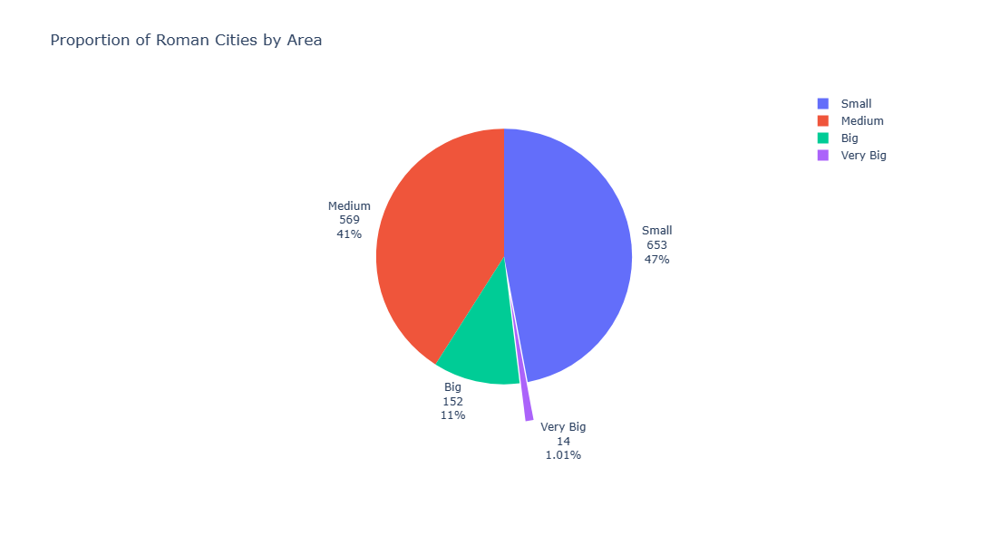

In [52]:
fig = px.pie(areas_count, values='Counts', names='Size', title='Proportion of Roman Cities by Area')

fig.update_traces(pull=[0, 0, 0, 0.3], 
                 textposition='outside', textinfo='percent+value+label')
fig.update_layout(
    autosize=False,
    width=600,
    height=600
)
fig.show()

Finally let's save the dataset to the csv file

In [53]:
cities.to_csv('roman_cities.csv', index = False)